#Fitbit Consumer Behaviour Analysis


## Importing the libraries



In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


## Reading the Data

### Reading the minutes Datasets


In [ ]:
minutes_calories = pd.read_csv("/content/minuteCaloriesNarrow_merged.csv")
minutes_intensities = pd.read_csv("/content/minuteIntensitiesNarrow_merged.csv")
minutes_steps = pd.read_csv("/content/minuteStepsNarrow_merged.csv")
minutes_mets = pd.read_csv("/content/minuteMETsNarrow_merged.csv")
minutes_sleep = pd.read_csv("/content/minuteSleep_merged.csv")

### Reading the hourly Datasets

In [ ]:
hourly_calories = pd.read_csv("/content/hourlyCalories_merged.csv")
hourly_steps = pd.read_csv("/content/hourlySteps_merged.csv")
hourly_intensities = pd.read_csv("/content/hourlyIntensities_merged.csv")

### Reading the Daily Datasets

In [ ]:
daily_activity = pd.read_csv("/content/dailyActivity_merged.csv")
daily_calories = pd.read_csv("/content/dailyCalories_merged.csv")
daily_intensities = pd.read_csv("/content/dailyIntensities_merged.csv")
daily_steps = pd.read_csv("/content/dailySteps_merged.csv")

### Reading Other Datasets


In [ ]:
sleep_day = pd.read_csv("/content/sleepDay_merged.csv")
weight_log = pd.read_csv("/content/weightLogInfo_merged.csv")
heart_rate = pd.read_csv("/content/heartrate_seconds_merged.csv")

### Creating the Duplicattes

In [ ]:
# Daily Datasets
da = daily_activity.copy()
dc = daily_calories.copy()
di = daily_intensities.copy()
ds = daily_steps.copy()

# Hourly Datasets
hc = hourly_calories.copy()
hi = hourly_intensities.copy()
hs = hourly_steps.copy()

# Minutes Datasets
mc = minutes_calories.copy()
mi = minutes_intensities.copy()
mst = minutes_steps.copy()
mm = minutes_mets.copy()
msl = minutes_sleep.copy()

# Other Datasets
sd = sleep_day.copy()
wl = weight_log.copy()
hr = heart_rate.copy()

## Data Preprocessing

### Daily Datasets

In [ ]:
print(da.head())
print(dc.head())
print(di.head())
print(ds.head())

           Id ActivityDate  TotalSteps  TotalDistance  TrackerDistance  \
0  1503960366    4/12/2016       13162           8.50             8.50   
1  1503960366    4/13/2016       10735           6.97             6.97   
2  1503960366    4/14/2016       10460           6.74             6.74   
3  1503960366    4/15/2016        9762           6.28             6.28   
4  1503960366    4/16/2016       12669           8.16             8.16   

   LoggedActivitiesDistance  VeryActiveDistance  ModeratelyActiveDistance  \
0                       0.0                1.88                      0.55   
1                       0.0                1.57                      0.69   
2                       0.0                2.44                      0.40   
3                       0.0                2.14                      1.26   
4                       0.0                2.71                      0.41   

   LightActiveDistance  SedentaryActiveDistance  VeryActiveMinutes  \
0                 6.06

In [ ]:
print(da.info())
print(dc.info())
print(di.info())
print(ds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 940 entries, 0 to 939
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Id                        940 non-null    int64  
 1   ActivityDate              940 non-null    object 
 2   TotalSteps                940 non-null    int64  
 3   TotalDistance             940 non-null    float64
 4   TrackerDistance           940 non-null    float64
 5   LoggedActivitiesDistance  940 non-null    float64
 6   VeryActiveDistance        940 non-null    float64
 7   ModeratelyActiveDistance  940 non-null    float64
 8   LightActiveDistance       940 non-null    float64
 9   SedentaryActiveDistance   940 non-null    float64
 10  VeryActiveMinutes         940 non-null    int64  
 11  FairlyActiveMinutes       940 non-null    int64  
 12  LightlyActiveMinutes      940 non-null    int64  
 13  SedentaryMinutes          940 non-null    int64  
 14  Calories  

In [ ]:
da['ActivityDate'] = pd.to_datetime(da['ActivityDate'])
dc['ActivityDay'] = pd.to_datetime(dc['ActivityDay'])
di['ActivityDay'] = pd.to_datetime(di['ActivityDay'])
ds['ActivityDay'] = pd.to_datetime(ds['ActivityDay'])

In [ ]:
merged_daily = pd.merge(di,dc,on = ['ActivityDay','Id'])
merged_daily = pd.merge(merged_daily, ds, on=['ActivityDay', 'Id'])
merged_daily = pd.merge(merged_daily, da[['Id', 'TotalDistance', 'TrackerDistance', 'LoggedActivitiesDistance']], on='Id', how='left')
merged_daily.head()

,Id,ActivityDay,SedentaryMinutes,LightlyActiveMinutes,FairlyActiveMinutes,VeryActiveMinutes,SedentaryActiveDistance,LightActiveDistance,ModeratelyActiveDistance,VeryActiveDistance,Calories,StepTotal,TotalDistance,TrackerDistance,LoggedActivitiesDistance
0,1503960366,2016-04-12,728,328,13,25,0.0,6.06,0.55,1.88,1985,13162,8.50,8.50,0.0
1,1503960366,2016-04-12,728,328,13,25,0.0,6.06,0.55,1.88,1985,13162,6.97,6.97,0.0
2,1503960366,2016-04-12,728,328,13,25,0.0,6.06,0.55,1.88,1985,13162,6.74,6.74,0.0
3,1503960366,2016-04-12,728,328,13,25,0.0,6.06,0.55,1.88,1985,13162,6.28,6.28,0.0
4,1503960366,2016-04-12,728,328,13,25,0.0,6.06,0.55,1.88,1985,13162,8.16,8.16,0.0


In [ ]:
merged_daily = merged_daily.drop_duplicates()

In [ ]:
merged_daily.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25382 entries, 0 to 27799
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Id                        25382 non-null  int64         
 1   ActivityDay               25382 non-null  datetime64[ns]
 2   SedentaryMinutes          25382 non-null  int64         
 3   LightlyActiveMinutes      25382 non-null  int64         
 4   FairlyActiveMinutes       25382 non-null  int64         
 5   VeryActiveMinutes         25382 non-null  int64         
 6   SedentaryActiveDistance   25382 non-null  float64       
 7   LightActiveDistance       25382 non-null  float64       
 8   ModeratelyActiveDistance  25382 non-null  float64       
 9   VeryActiveDistance        25382 non-null  float64       
 10  Calories                  25382 non-null  int64         
 11  StepTotal                 25382 non-null  int64         
 12  TotalDistance     

### Hourly Datasets

In [ ]:
print(hi.head())
print(hc.head())
print(hs.head())

           Id           ActivityHour  TotalIntensity  AverageIntensity
0  1503960366  4/12/2016 12:00:00 AM              20          0.333333
1  1503960366   4/12/2016 1:00:00 AM               8          0.133333
2  1503960366   4/12/2016 2:00:00 AM               7          0.116667
3  1503960366   4/12/2016 3:00:00 AM               0          0.000000
4  1503960366   4/12/2016 4:00:00 AM               0          0.000000
           Id           ActivityHour  Calories
0  1503960366  4/12/2016 12:00:00 AM        81
1  1503960366   4/12/2016 1:00:00 AM        61
2  1503960366   4/12/2016 2:00:00 AM        59
3  1503960366   4/12/2016 3:00:00 AM        47
4  1503960366   4/12/2016 4:00:00 AM        48
           Id           ActivityHour  StepTotal
0  1503960366  4/12/2016 12:00:00 AM        373
1  1503960366   4/12/2016 1:00:00 AM        160
2  1503960366   4/12/2016 2:00:00 AM        151
3  1503960366   4/12/2016 3:00:00 AM          0
4  1503960366   4/12/2016 4:00:00 AM          0


In [ ]:
hi['ActivityHour'] = pd.to_datetime(hi['ActivityHour'])
hc['ActivityHour'] = pd.to_datetime(hc['ActivityHour'])
hs['ActivityHour'] = pd.to_datetime(hs['ActivityHour'])

In [ ]:
merged_hourly = pd.merge(hi,hc, on =['Id','ActivityHour'],how ='left')
merged_hourly = pd.merge(merged_hourly,hs, on = ['Id','ActivityHour'],how ='left')

In [ ]:
merged_hourly.head()

,Id,ActivityHour,TotalIntensity,AverageIntensity,Calories,StepTotal
0,1503960366,2016-04-12 00:00:00,20,0.333333,81,373
1,1503960366,2016-04-12 01:00:00,8,0.133333,61,160
2,1503960366,2016-04-12 02:00:00,7,0.116667,59,151
3,1503960366,2016-04-12 03:00:00,0,0.000000,47,0
4,1503960366,2016-04-12 04:00:00,0,0.000000,48,0


In [ ]:
merged_hourly.drop_duplicates()

,Id,ActivityHour,TotalIntensity,AverageIntensity,Calories,StepTotal
0,1503960366,2016-04-12 00:00:00,20,0.333333,81,373
1,1503960366,2016-04-12 01:00:00,8,0.133333,61,160
2,1503960366,2016-04-12 02:00:00,7,0.116667,59,151
3,1503960366,2016-04-12 03:00:00,0,0.000000,47,0
4,1503960366,2016-04-12 04:00:00,0,0.000000,48,0
...,...,...,...,...,...,...
22094,8877689391,2016-05-12 10:00:00,12,0.200000,126,514
22095,8877689391,2016-05-12 11:00:00,29,0.483333,192,1407
22096,8877689391,2016-05-12 12:00:00,93,1.550000,321,3135
22097,8877689391,2016-05-12 13:00:00,6,0.100000,101,307


In [ ]:
merged_hourly.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22099 entries, 0 to 22098
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Id                22099 non-null  int64         
 1   ActivityHour      22099 non-null  datetime64[ns]
 2   TotalIntensity    22099 non-null  int64         
 3   AverageIntensity  22099 non-null  float64       
 4   Calories          22099 non-null  int64         
 5   StepTotal         22099 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(4)
memory usage: 1.2 MB


### Minutes datasets

In [ ]:
print(mc.head())
print(mi.head())
print(mst.head())
print(mm.head())
print(msl.head())

           Id         ActivityMinute  Calories
0  1503960366  4/12/2016 12:00:00 AM    0.7865
1  1503960366  4/12/2016 12:01:00 AM    0.7865
2  1503960366  4/12/2016 12:02:00 AM    0.7865
3  1503960366  4/12/2016 12:03:00 AM    0.7865
4  1503960366  4/12/2016 12:04:00 AM    0.7865
           Id         ActivityMinute  Intensity
0  1503960366  4/12/2016 12:00:00 AM        0.0
1  1503960366  4/12/2016 12:01:00 AM        0.0
2  1503960366  4/12/2016 12:02:00 AM        0.0
3  1503960366  4/12/2016 12:03:00 AM        0.0
4  1503960366  4/12/2016 12:04:00 AM        0.0
           Id         ActivityMinute  Steps
0  1503960366  4/12/2016 12:00:00 AM    0.0
1  1503960366  4/12/2016 12:01:00 AM    0.0
2  1503960366  4/12/2016 12:02:00 AM    0.0
3  1503960366  4/12/2016 12:03:00 AM    0.0
4  1503960366  4/12/2016 12:04:00 AM    0.0
           Id         ActivityMinute  METs
0  1503960366  4/12/2016 12:00:00 AM    10
1  1503960366  4/12/2016 12:01:00 AM    10
2  1503960366  4/12/2016 12:02:00 AM 

In [ ]:
mi['ActivityMinute'] = pd.to_datetime(mi['ActivityMinute'])
mm['ActivityMinute'] = pd.to_datetime(mm['ActivityMinute'])
mst['ActivityMinute'] = pd.to_datetime(mst['ActivityMinute'])
mc['ActivityMinute'] = pd.to_datetime(mc['ActivityMinute'])
msl['date'] = pd.to_datetime(msl['date'])

In [ ]:
merged_minute = pd.merge(mi, mm, on=['Id', 'ActivityMinute'], how='left')
merged_minute = pd.merge(merged_minute, mst, on=['Id', 'ActivityMinute'], how='left')
merged_minute = pd.merge(merged_minute, mc, on=['Id', 'ActivityMinute'], how='left')

In [ ]:
merged_minute.info()
print(merged_minute.head())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 179956 entries, 0 to 179955
Data columns (total 6 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Id              179956 non-null  int64         
 1   ActivityMinute  179955 non-null  datetime64[ns]
 2   Intensity       179955 non-null  float64       
 3   METs            174989 non-null  float64       
 4   Steps           179403 non-null  float64       
 5   Calories        124923 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 9.6 MB
           Id      ActivityMinute  Intensity  METs  Steps  Calories
0  1503960366 2016-04-12 00:00:00        0.0  10.0    0.0    0.7865
1  1503960366 2016-04-12 00:01:00        0.0  10.0    0.0    0.7865
2  1503960366 2016-04-12 00:02:00        0.0  10.0    0.0    0.7865
3  1503960366 2016-04-12 00:03:00        0.0  10.0    0.0    0.7865
4  1503960366 2016-04-12 00:04:00        0.0  10.0    0.0

### Other Datasets

In [ ]:
print(sd.head())

           Id               SleepDay  TotalSleepRecords  TotalMinutesAsleep  \
0  1503960366  4/12/2016 12:00:00 AM                  1                 327   
1  1503960366  4/13/2016 12:00:00 AM                  2                 384   
2  1503960366  4/15/2016 12:00:00 AM                  1                 412   
3  1503960366  4/16/2016 12:00:00 AM                  2                 340   
4  1503960366  4/17/2016 12:00:00 AM                  1                 700   

   TotalTimeInBed  
0             346  
1             407  
2             442  
3             367  
4             712  


In [ ]:
print(wl.head())


           Id                   Date    WeightKg  WeightPounds   Fat  \
0  1503960366   5/2/2016 11:59:59 PM   52.599998    115.963147  22.0   
1  1503960366   5/3/2016 11:59:59 PM   52.599998    115.963147   NaN   
2  1927972279   4/13/2016 1:08:52 AM  133.500000    294.317120   NaN   
3  2873212765  4/21/2016 11:59:59 PM   56.700001    125.002104   NaN   
4  2873212765  5/12/2016 11:59:59 PM   57.299999    126.324875   NaN   

         BMI  IsManualReport          LogId  
0  22.650000            True  1462233599000  
1  22.650000            True  1462319999000  
2  47.540001           False  1460509732000  
3  21.450001            True  1461283199000  
4  21.690001            True  1463097599000  


In [ ]:
print(hr.head())


           Id                  Time  Value
0  2022484408  4/12/2016 7:21:00 AM   97.0
1  2022484408  4/12/2016 7:21:05 AM  102.0
2  2022484408  4/12/2016 7:21:10 AM  105.0
3  2022484408  4/12/2016 7:21:20 AM  103.0
4  2022484408  4/12/2016 7:21:25 AM  101.0


In [ ]:
wl['Date'] = pd.to_datetime(wl['Date'])
hr['Time'] = pd.to_datetime(hr['Time'])
sd['SleepDay'] = pd.to_datetime(sd['SleepDay'])

In [ ]:
wl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67 entries, 0 to 66
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Id              67 non-null     int64         
 1   Date            67 non-null     datetime64[ns]
 2   WeightKg        67 non-null     float64       
 3   WeightPounds    67 non-null     float64       
 4   Fat             2 non-null      float64       
 5   BMI             67 non-null     float64       
 6   IsManualReport  67 non-null     bool          
 7   LogId           67 non-null     int64         
dtypes: bool(1), datetime64[ns](1), float64(4), int64(2)
memory usage: 3.9 KB


In [ ]:
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174325 entries, 0 to 174324
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   Id      174325 non-null  int64         
 1   Time    174325 non-null  datetime64[ns]
 2   Value   174324 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 4.0 MB


In [ ]:
sd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 0 to 412
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Id                  413 non-null    int64         
 1   SleepDay            413 non-null    datetime64[ns]
 2   TotalSleepRecords   413 non-null    int64         
 3   TotalMinutesAsleep  413 non-null    int64         
 4   TotalTimeInBed      413 non-null    int64         
dtypes: datetime64[ns](1), int64(4)
memory usage: 16.3 KB


## Cleaned and merged Datasets


*  **merged_daily**: All daily data are contained in merged_daily,
*  **merged_hourly**: all hourly data are contained in merged_hourly
*  **merged_minute**: all minute data are contained in merged_minute.
*  **hr**: containing data on heart rate
*  **wl**: containing data on weight log
*  **sd**: Including Sleep Day information
*  **msl**: Holding Sleep Day information for a few minutes


## Data Visualisations

### merged_daily

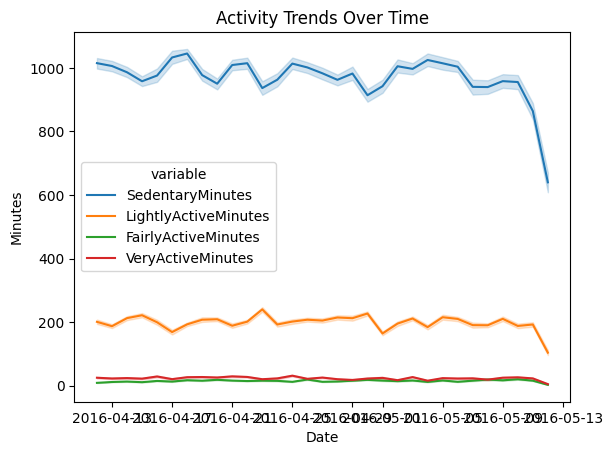

In [ ]:
sns.lineplot(x='ActivityDay', y='value', hue='variable',data=pd.melt(merged_daily, id_vars=['ActivityDay'],
                          value_vars=['SedentaryMinutes', 'LightlyActiveMinutes',
                                      'FairlyActiveMinutes', 'VeryActiveMinutes']))
plt.title('Activity Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Minutes')
plt.show()

Trends Over Time

In [ ]:
activity_distance = merged_daily[['SedentaryActiveDistance', 'LightActiveDistance',
                        'ModeratelyActiveDistance', 'VeryActiveDistance']].sum()
fig = px.bar(x=activity_distance.index, y=activity_distance.values,
             labels={'x': 'Activity Level', 'y': 'Distance (in miles)'},
             title='Distance Covered by Activity Level')
fig.show()

Activity Distribution

In [ ]:
fig = px.scatter(merged_daily, x='ActivityDay', y='Calories', title='Calories Burnt Over Time')
fig.show()

Distance Covered by Activity Level

In [ ]:
fig = px.histogram(merged_daily, x='StepTotal', nbins=20, title='Step Count Distribution')
fig.show()

Step Count Distribution

In [ ]:
distance_comparison = merged_daily[['TotalDistance', 'TrackerDistance', 'LoggedActivitiesDistance']].sum()
fig = px.bar(x=distance_comparison.index, y=distance_comparison.values,
             labels={'x': 'Distance Type', 'y': 'Distance (in miles)'},
             title='Distance Comparison')
fig.show()

Distance Comparison

<ipython-input-45-b4c0804c563f>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



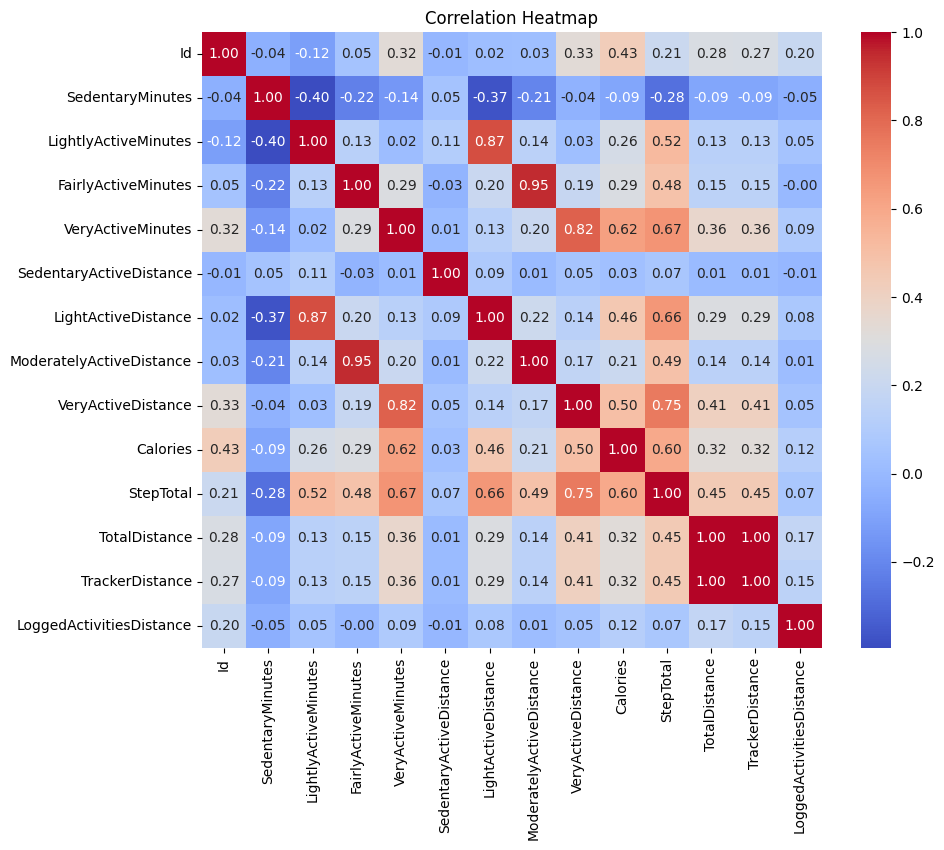

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(merged_daily.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

Correlation Heatmap

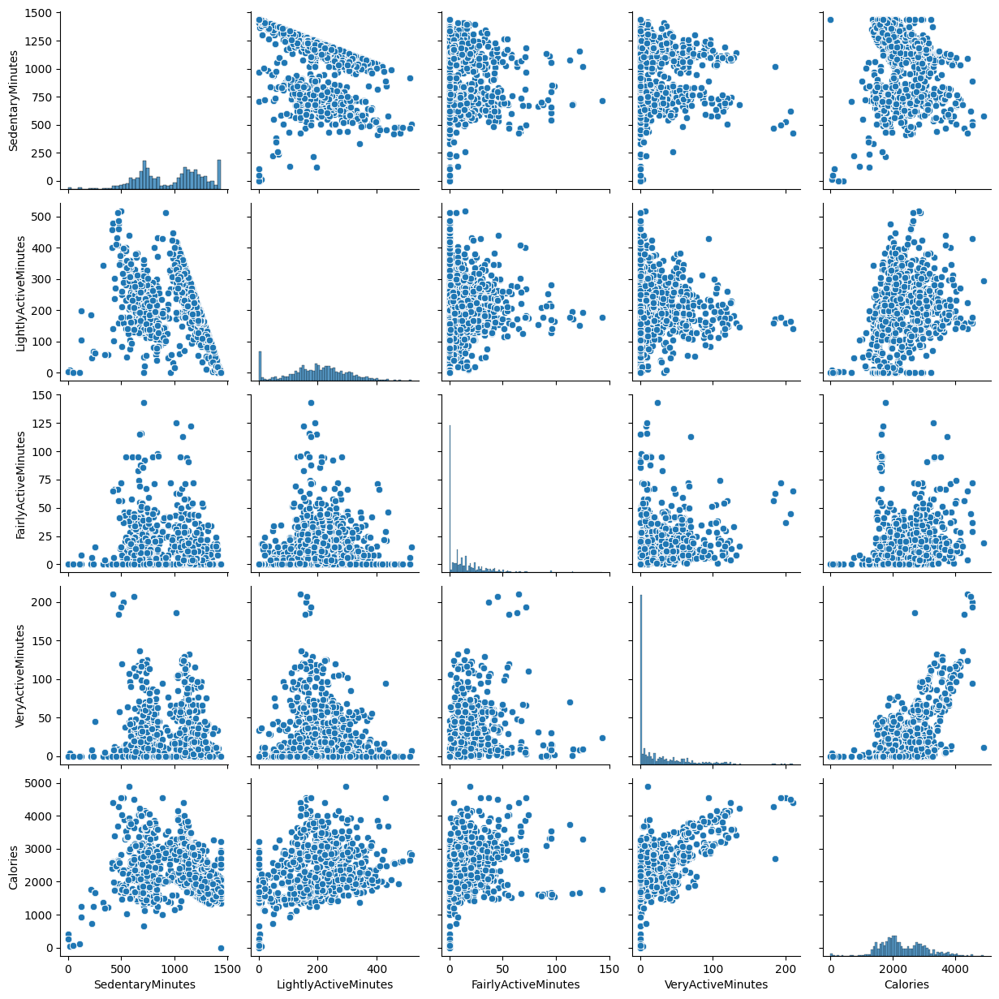

In [ ]:
sns.pairplot(merged_daily, vars=['SedentaryMinutes', 'LightlyActiveMinutes',
                       'FairlyActiveMinutes', 'VeryActiveMinutes', 'Calories'])
plt.show()

Activity Level vs. Calories Burnt

### merged_hourly

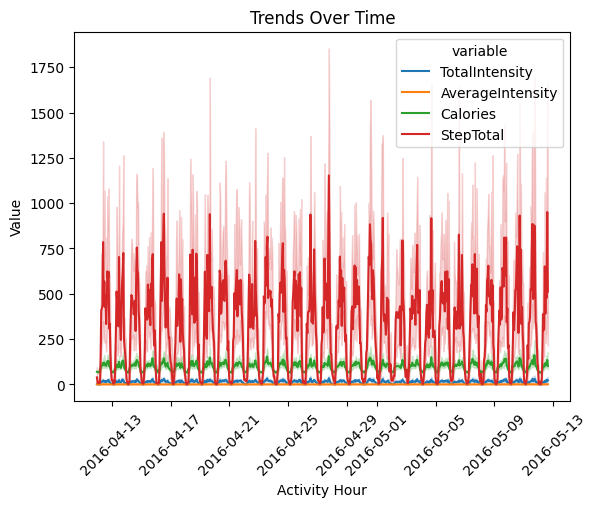

In [ ]:
# Trends Over Time
sns.lineplot(x='ActivityHour', y='value', hue='variable',
             data=pd.melt(merged_hourly, id_vars=['ActivityHour'],
                          value_vars=['TotalIntensity', 'AverageIntensity',
                                      'Calories', 'StepTotal']))
plt.title('Trends Over Time')
plt.xlabel('Activity Hour')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()

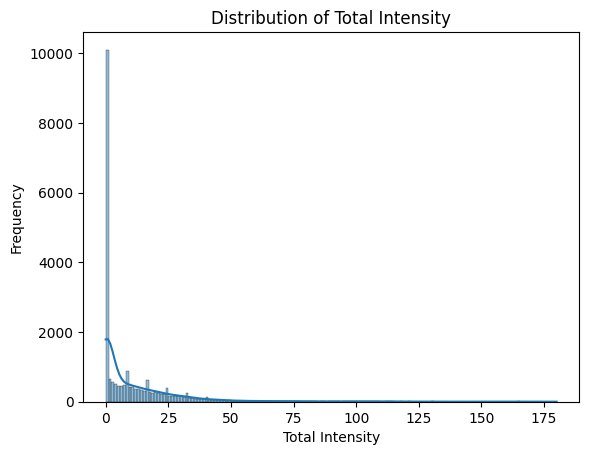

In [ ]:
# Distribution of Intensity
sns.histplot(merged_hourly['TotalIntensity'], kde=True)
plt.title('Distribution of Total Intensity')
plt.xlabel('Total Intensity')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Calories Burnt Over Time
fig = px.line(merged_hourly, x='ActivityHour', y='Calories', title='Calories Burnt Over Time')
fig.show()

In [ ]:
# Step Count Over Time
fig = px.line(merged_hourly, x='ActivityHour', y='StepTotal', title='Step Count Over Time')
fig.show()

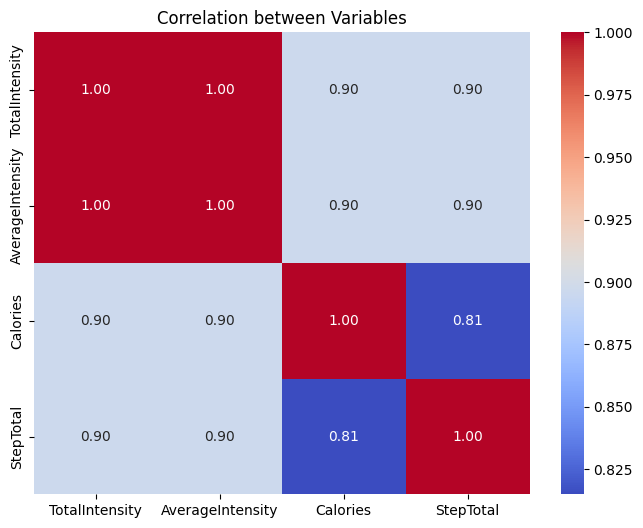

In [ ]:
# Correlation between Variables
plt.figure(figsize=(8, 6))
sns.heatmap(merged_hourly[['TotalIntensity', 'AverageIntensity', 'Calories', 'StepTotal']].corr(),
            annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between Variables')
plt.show()

### merged_minute

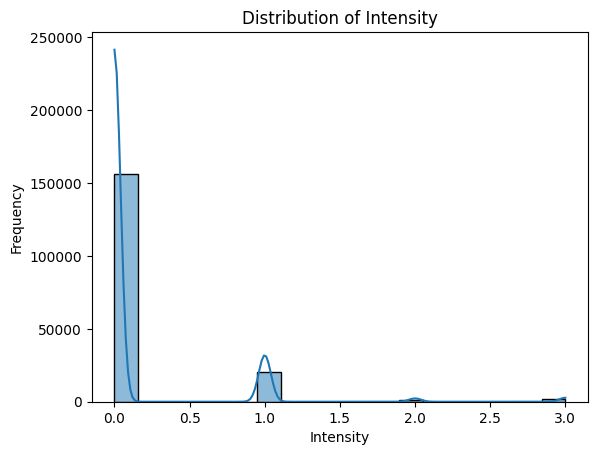

In [ ]:
# Distribution of Intensity
sns.histplot(merged_minute['Intensity'], kde=True)
plt.title('Distribution of Intensity')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Calories Burnt Over Time
fig = px.line(merged_minute, x='ActivityMinute', y='Calories', title='Calories Burnt Over Time')
fig.show()


In [ ]:
# Step Count Over Time
fig = px.line(merged_minute, x='ActivityMinute', y='Steps', title='Step Count Over Time')
fig.show()


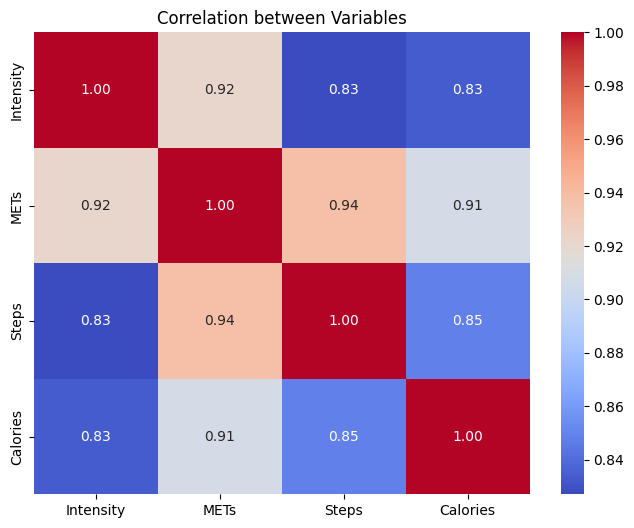

In [ ]:
# Correlation between Variables
plt.figure(figsize=(8, 6))
sns.heatmap(merged_minute[['Intensity', 'METs', 'Steps', 'Calories']].corr(),
            annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between Variables')
plt.show()

### hr

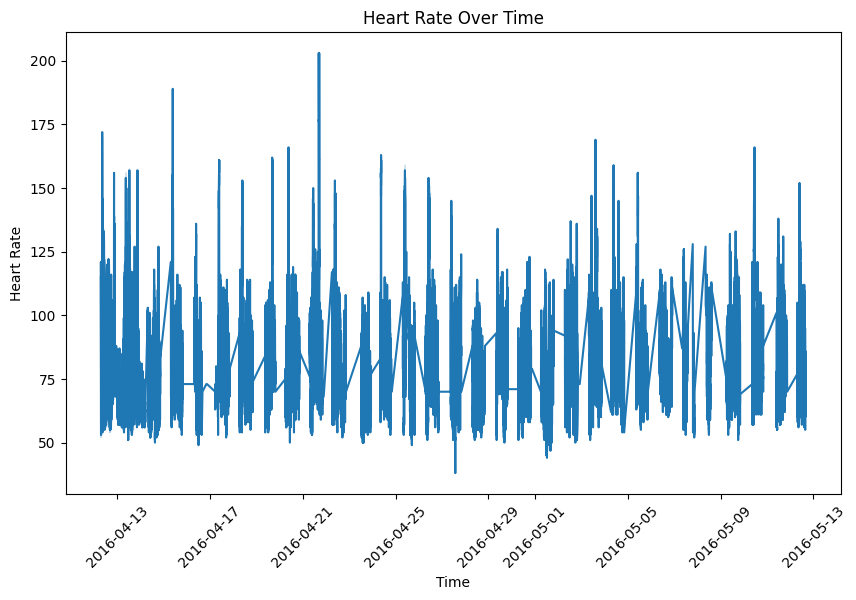

In [ ]:
# Trends Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='Time', y='Value', data=hr)
plt.title('Heart Rate Over Time')
plt.xlabel('Time')
plt.ylabel('Heart Rate')
plt.xticks(rotation=45)
plt.show()


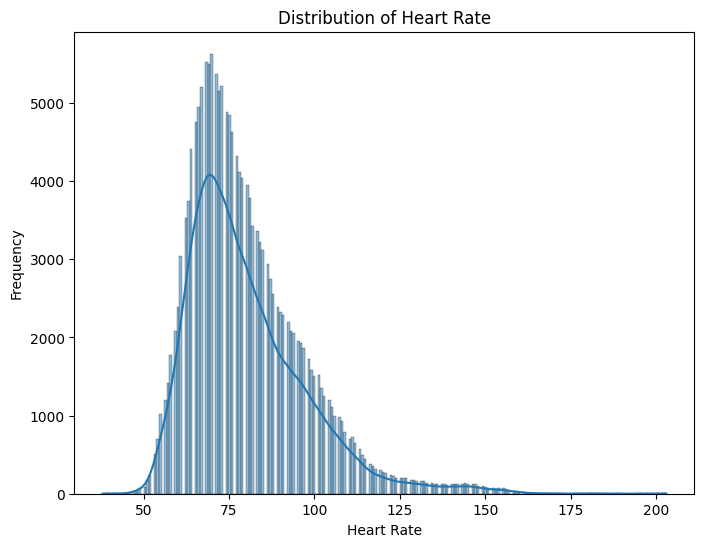

In [ ]:
# Distribution of Heart Rate
plt.figure(figsize=(8, 6))
sns.histplot(hr['Value'], kde=True)
plt.title('Distribution of Heart Rate')
plt.xlabel('Heart Rate')
plt.ylabel('Frequency')
plt.show()

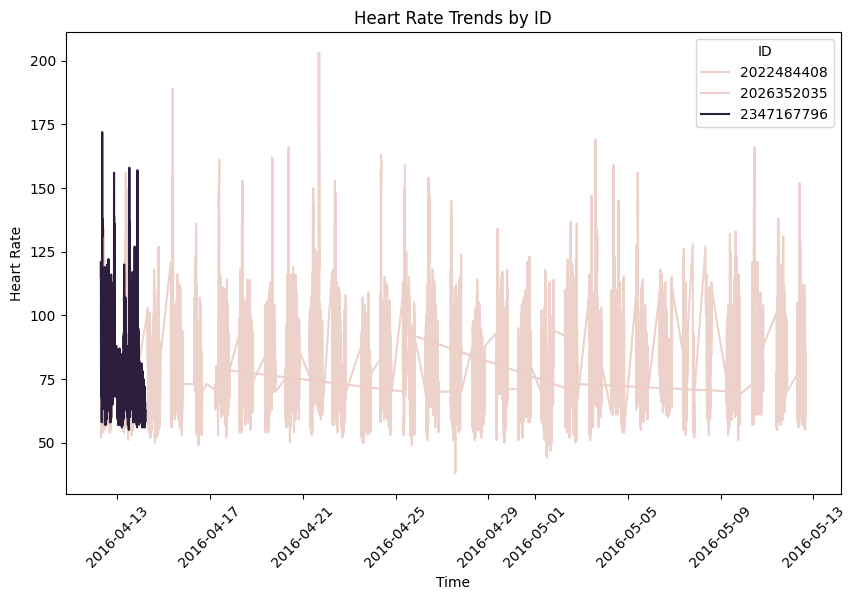

In [ ]:
# Heart Rate Trends by ID (assuming multiple IDs)
plt.figure(figsize=(10, 6))
sns.lineplot(x='Time', y='Value', hue='Id', data=hr)
plt.title('Heart Rate Trends by ID')
plt.xlabel('Time')
plt.ylabel('Heart Rate')
plt.xticks(rotation=45)
plt.legend(title='ID')
plt.show()

### wl

In [ ]:
wl.dtypes

Id                         int64
Date              datetime64[ns]
WeightKg                 float64
WeightPounds             float64
Fat                      float64
BMI                      float64
IsManualReport              bool
LogId                      int64
dtype: object

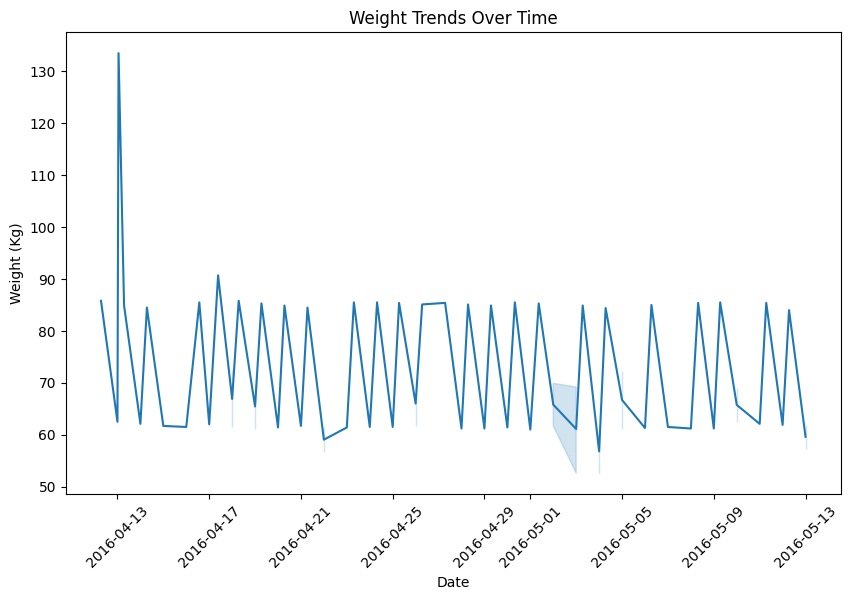

In [ ]:
# Weight Trends Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='Date', y='WeightKg', data=wl)
plt.title('Weight Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Weight (Kg)')
plt.xticks(rotation=45)
plt.show()

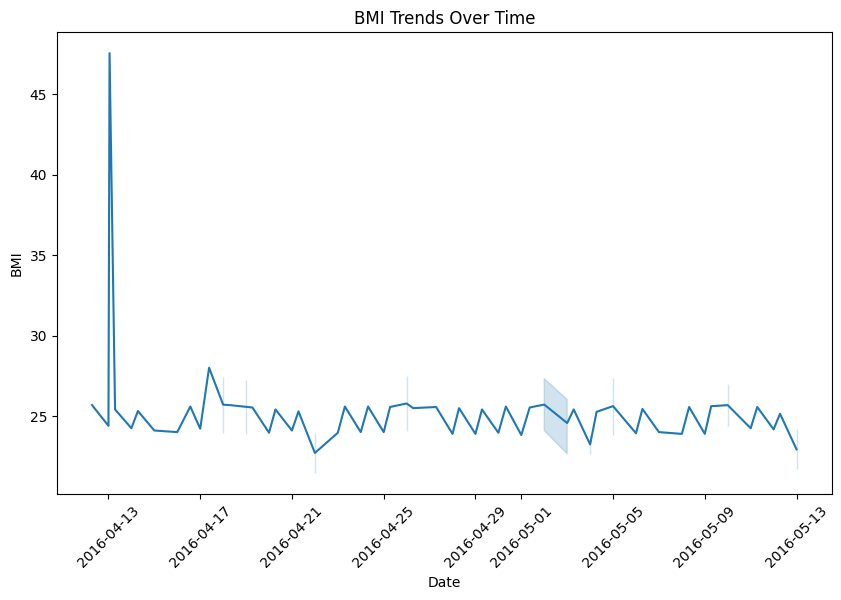

In [ ]:
# BMI Trends Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='Date', y='BMI', data=wl)
plt.title('BMI Trends Over Time')
plt.xlabel('Date')
plt.ylabel('BMI')
plt.xticks(rotation=45)
plt.show()

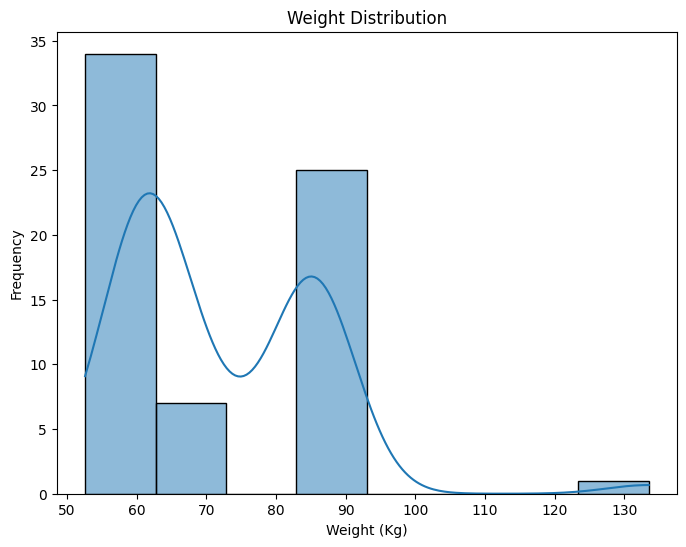

In [ ]:
# Weight Distribution
plt.figure(figsize=(8, 6))
sns.histplot(wl['WeightKg'], kde=True)
plt.title('Weight Distribution')
plt.xlabel('Weight (Kg)')
plt.ylabel('Frequency')
plt.show()


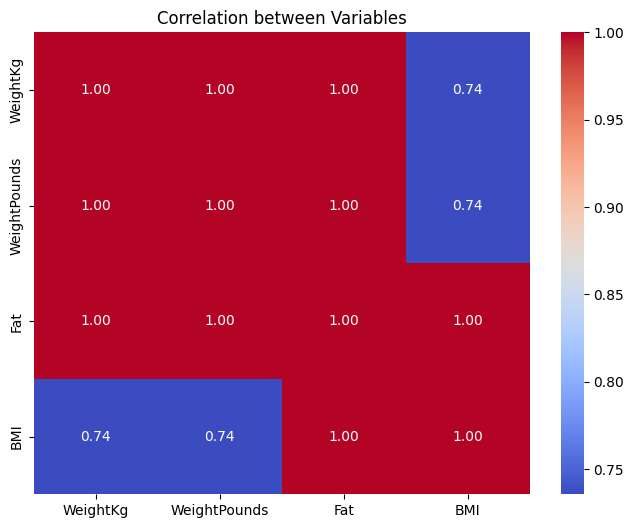

In [ ]:
# Correlation between Variables
plt.figure(figsize=(8, 6))
sns.heatmap(wl[['WeightKg', 'WeightPounds', 'Fat', 'BMI']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between Variables')
plt.show()

### sd

In [ ]:
sd.dtypes

Id                             int64
SleepDay              datetime64[ns]
TotalSleepRecords              int64
TotalMinutesAsleep             int64
TotalTimeInBed                 int64
dtype: object

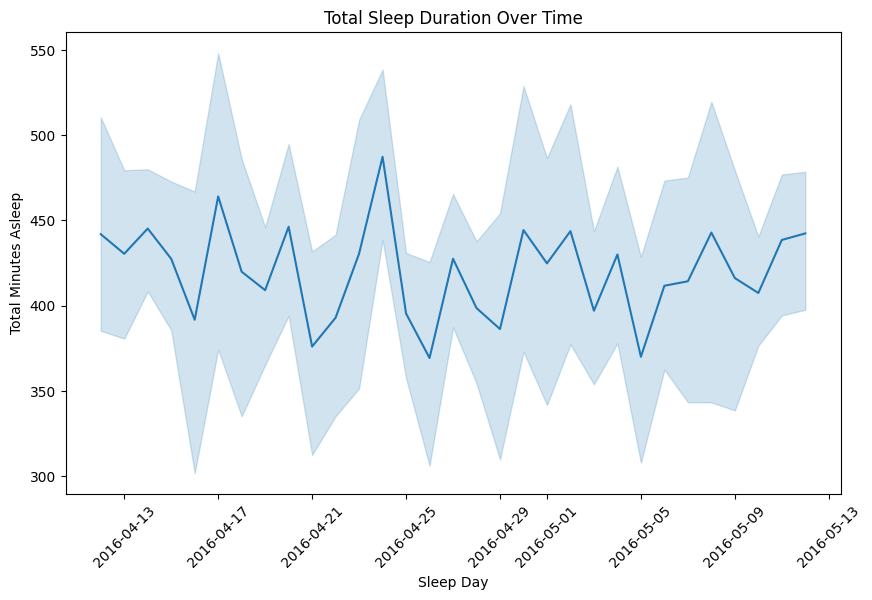

In [ ]:
# Total Sleep Duration Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='SleepDay', y='TotalMinutesAsleep', data=sd)
plt.title('Total Sleep Duration Over Time')
plt.xlabel('Sleep Day')
plt.ylabel('Total Minutes Asleep')
plt.xticks(rotation=45)
plt.show()

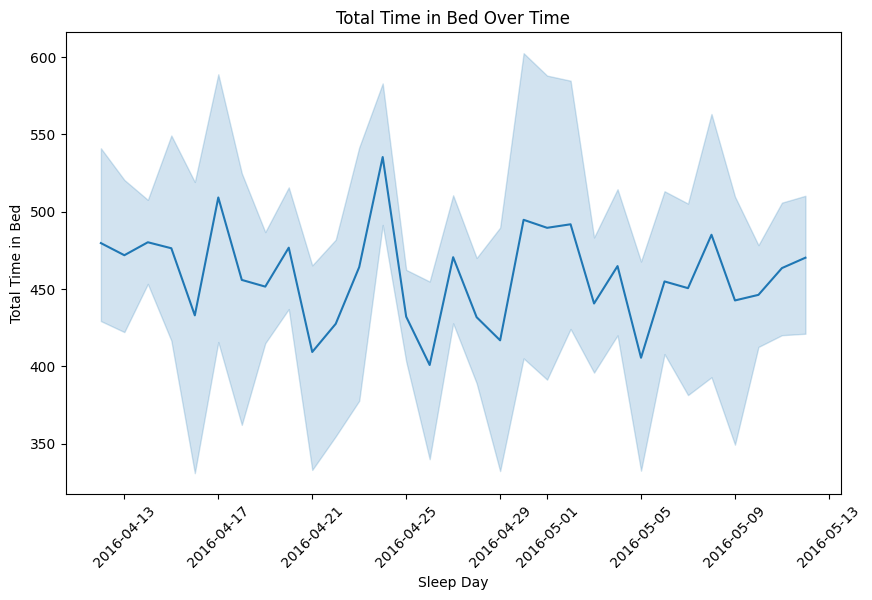

In [ ]:
# Total Time in Bed Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='SleepDay', y='TotalTimeInBed', data=sd)
plt.title('Total Time in Bed Over Time')
plt.xlabel('Sleep Day')
plt.ylabel('Total Time in Bed')
plt.xticks(rotation=45)
plt.show()


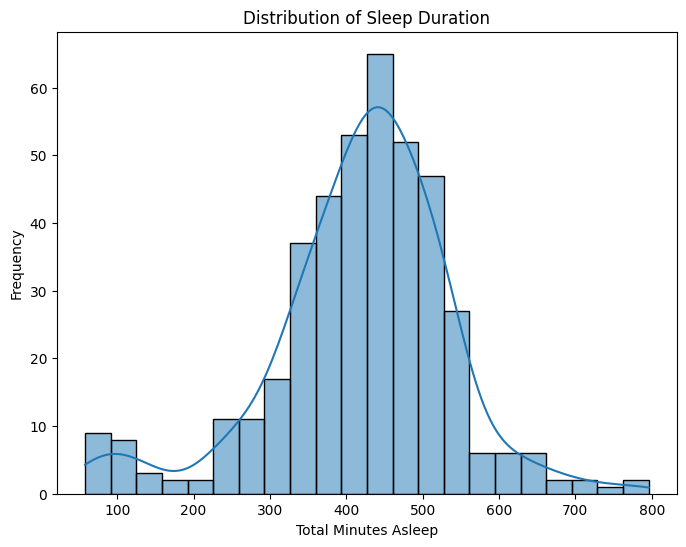

In [ ]:
# Distribution of Sleep Duration
plt.figure(figsize=(8, 6))
sns.histplot(sd['TotalMinutesAsleep'], kde=True)
plt.title('Distribution of Sleep Duration')
plt.xlabel('Total Minutes Asleep')
plt.ylabel('Frequency')
plt.show()

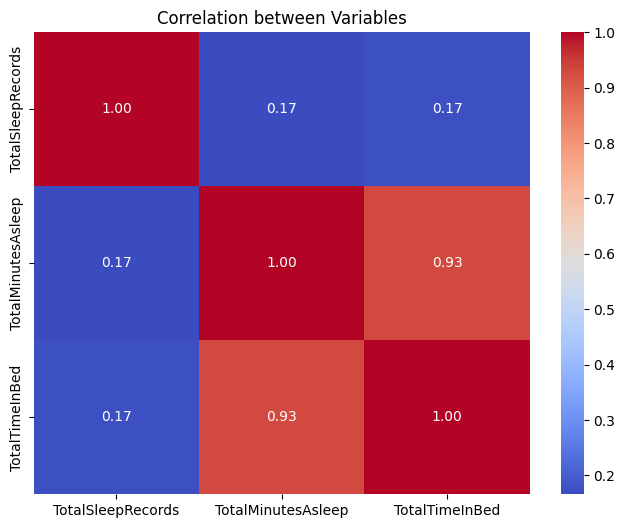

In [ ]:
# Correlation between Variables
plt.figure(figsize=(8, 6))
sns.heatmap(sd[['TotalSleepRecords', 'TotalMinutesAsleep', 'TotalTimeInBed']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between Variables')
plt.show()

### msl

In [ ]:
msl.dtypes

Id                int64
date     datetime64[ns]
value           float64
logId           float64
dtype: object

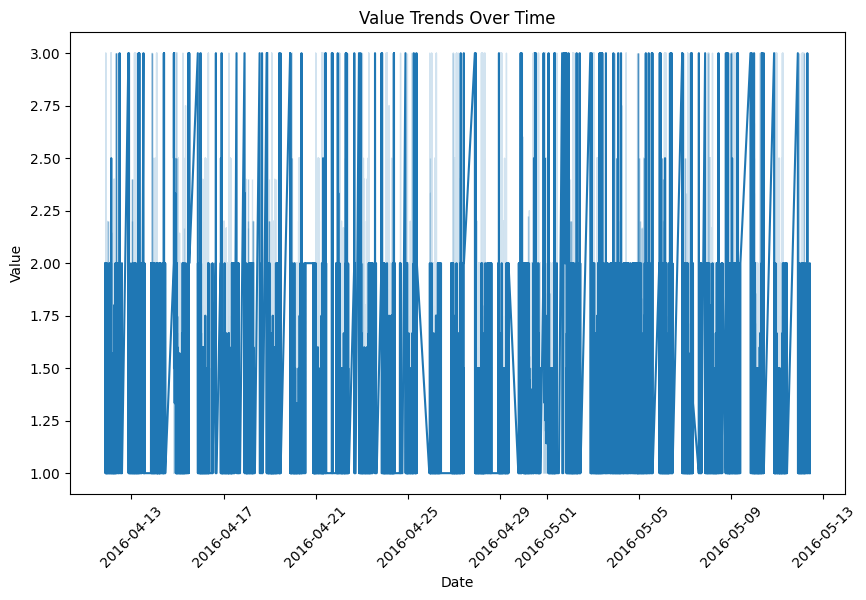

In [ ]:
# Value Trends Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='date', y='value', data=msl)
plt.title('Value Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()

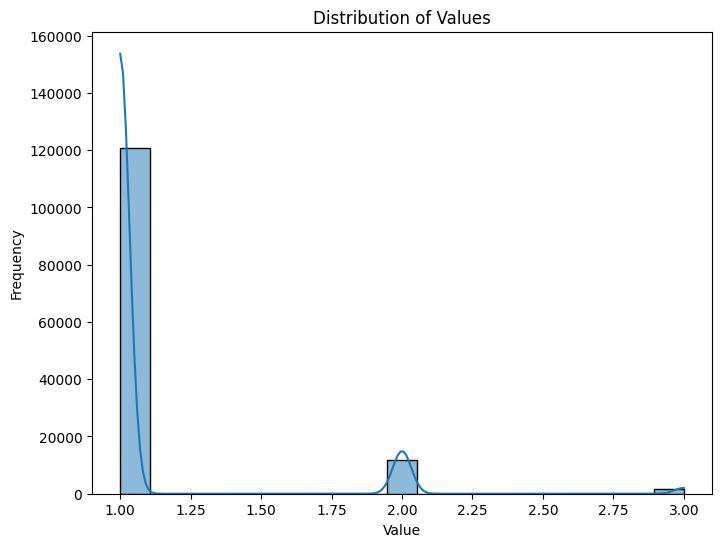

In [ ]:
# Distribution of Values
plt.figure(figsize=(8, 6))
sns.histplot(msl['value'], kde=True)
plt.title('Distribution of Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

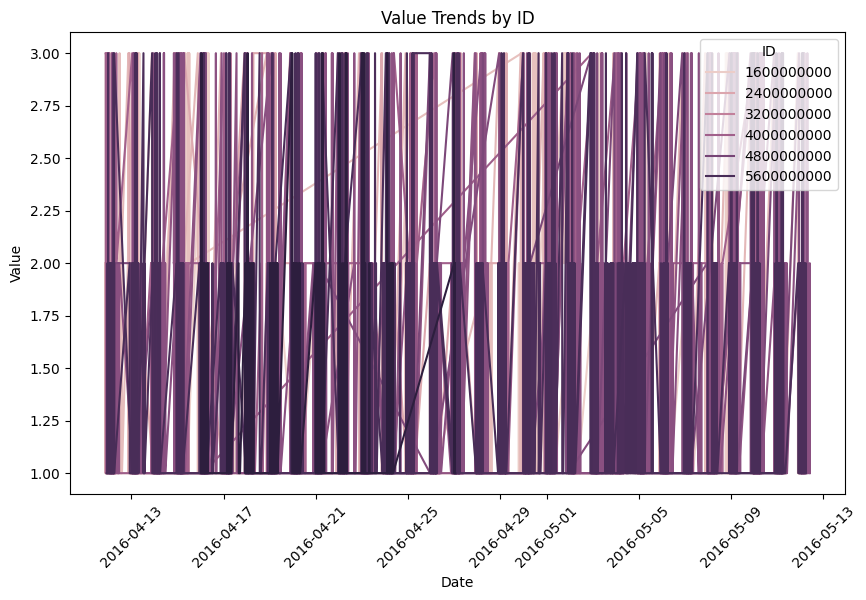

In [ ]:
# Value Trends by ID (assuming multiple IDs)
plt.figure(figsize=(10, 6))
sns.lineplot(x='date', y='value', hue='Id', data=msl)
plt.title('Value Trends by ID')
plt.xlabel('Date')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend(title='ID')
plt.show()